## Libraries

In [1]:
%pip install opencv-python mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.1/36.1 MB 11.5 MB/s eta 0:00:00


In [2]:
import os
import cv2
import albumentations as A
import os
import matplotlib.pyplot as plt
import random
import cv2
import mediapipe as mp
import numpy as np

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


## **Import Dataset**

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Data Augmentation**

## Functions

In [4]:
def plot_image_class_distribution(balanced_output_path):
    """
    Counts the number of images per class in the specified directory
    and displays a bar chart with the image distribution.

    :param balanced_output_path: Path to the directory containing the folders per class.
    """
    # Count images in each folder
    class_counts = {}
    for label in os.listdir(balanced_output_path):
        label_path = os.path.join(balanced_output_path, label)
        if os.path.isdir(label_path):
            # Count image files on the folder
            num_images = len([file for file in os.listdir(label_path) if file.endswith(('.png', '.jpg', '.jpeg'))])
            class_counts[label] = num_images

    # Show the count
    print("Count of Images by Class:")
    for label, count in class_counts.items():
        print(f"Class {label}: {count} images")

    # Create the barplot
    plt.figure(figsize=(10, 6))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.title('Image Distribution by Class (Balanced)')
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Show the graph
    plt.show()


def display_random_images_by_class(balanced_output_path):
    """
    Gets a random image of each class in the specified directory
    and displays the images in a single graph, organized by labels.

    :param balanced_output_path: Path to the directory containing the folders per class.
    """
    random_images = {}

    # Get a random image from each class
    for label in os.listdir(balanced_output_path):
        label_path = os.path.join(balanced_output_path, label)
        if os.path.isdir(label_path):
            image_files = [
                os.path.join(label_path, file)
                for file in os.listdir(label_path)
                if file.endswith(('.png', '.jpg', '.jpeg'))
            ]
            if image_files:
                random_images[label] = random.choice(image_files)

    # Organize the labels in alphabetic order
    sorted_labels = sorted(random_images.keys())

    # Visualize random images
    num_classes = len(sorted_labels)
    plt.figure(figsize=(15, 5))

    for i, label in enumerate(sorted_labels, start=1):
        image_path = random_images[label]

        # Read the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Show in the subplot
        plt.subplot(1, num_classes, i)
        plt.imshow(image)
        plt.title(f"Label: {label}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

## Count of images without balancing

Count of Images by Class:
Class level2: 139 images
Class level1: 477 images
Class level3: 102 images
Class level0: 372 images


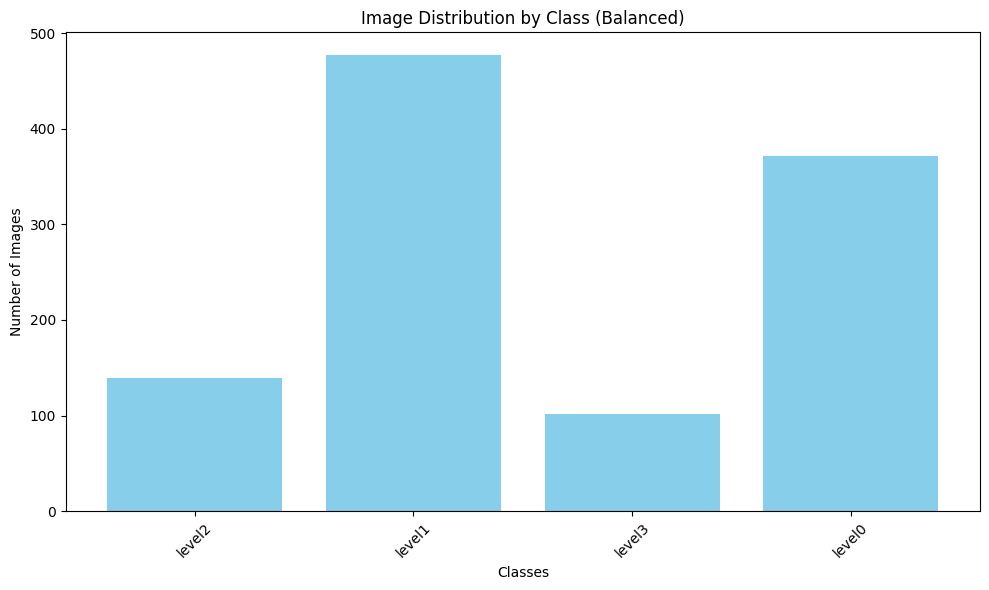

In [6]:
# Path to the balanced folder
path = '/content/drive/MyDrive/Lambton/ai_lab/data/training'
plot_image_class_distribution(path)

## balanceo

In [ ]:
# Base directory of the images
base_path = '/content/drive/MyDrive/Lambton/ai_lab/data/training'

# Directory to save the balanced images
balanced_output_path = '/content/drive/MyDrive/granos_preprosesing/balanced'
os.makedirs(balanced_output_path, exist_ok=True)

# Step 1: Count images in each folder
class_counts = {}
for label in os.listdir(base_path):
    label_path = os.path.join(base_path, label)
    if os.path.isdir(label_path):
        image_paths = [
            os.path.join(label_path, file)
            for file in os.listdir(label_path)
            if file.endswith(('.png', '.jpg', '.jpeg'))
        ]
        class_counts[label] = len(image_paths)

# Identify the majority class
max_class = max(class_counts, key=class_counts.get)
max_images = class_counts[max_class]
print(f"The majority class is '{max_class}' with {max_images} images.")

# Step 2: Define augmentations
augmentations = A.Compose([
    A.RandomRotate90(),
    A.Flip(),
    A.OneOf([
        A.MotionBlur(p=0.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
    ], p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.2),
])

# Step 3: Create balanced images
for label in os.listdir(base_path):
    label_path = os.path.join(base_path, label)
    output_label_path = os.path.join(balanced_output_path, label)
    os.makedirs(output_label_path, exist_ok=True)

    if os.path.isdir(label_path):
        # Get paths of original images
        image_paths = [
            os.path.join(label_path, file)
            for file in os.listdir(label_path)
            if file.endswith(('.png', '.jpg', '.jpeg'))
        ]

        # Copy original images to the new folder
        for image_path in image_paths:
            file_name = os.path.basename(image_path)
            output_path = os.path.join(output_label_path, file_name)
            os.system(f"cp '{image_path}' '{output_path}'")  # Copy file

        # Generate augmented images if needed
        num_to_generate = max_images - len(image_paths)
        if num_to_generate > 0:
            print(f"Generating {num_to_generate} images for class '{label}'.")
            for i in range(num_to_generate):
                # Select a random image
                img_path = image_paths[i % len(image_paths)]
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Apply augmentations
                augmented = augmentations(image=image)['image']

                # Save the augmented image
                aug_file_name = f"aug_{i}_{os.path.basename(img_path)}"
                aug_output_path = os.path.join(output_label_path, aug_file_name)
                cv2.imwrite(aug_output_path, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))

print(f"The balanced images have been saved in '{balanced_output_path}'.")


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
<ipython-input-1-ad22d2986048>:32: DeprecationWarning: Flip is deprecated. Consider using HorizontalFlip, VerticalFlip, RandomRotate90 or D4.
  A.Flip(),


La clase mayoritaria es 'level1' con 477 imágenes.
Generando 338 imágenes para la clase 'level2'.
Generando 375 imágenes para la clase 'level3'.
Generando 105 imágenes para la clase 'level0'.
Las imágenes balanceadas se han guardado en '/content/drive/MyDrive/balanced'.


Count of Images by Class:
Class train: 0 images
Class level2: 477 images
Class level1: 477 images
Class level3: 477 images
Class level0: 477 images
Class test: 0 images


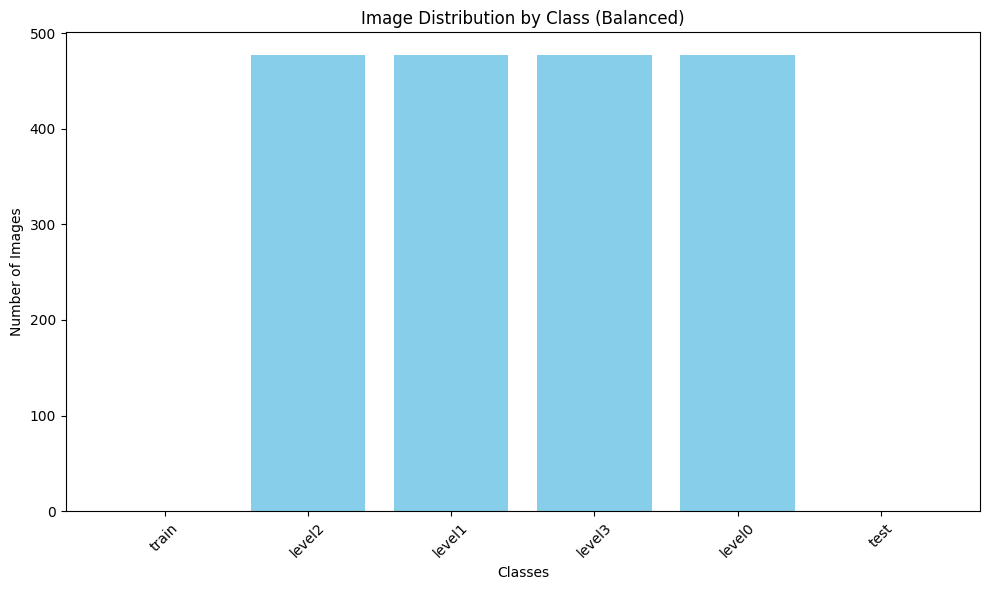

In [7]:
# Path to the balanced folder
path = '/content/drive/MyDrive/granos_preprosesing/balanced'
plot_image_class_distribution(path)

## Visualization of balanced images

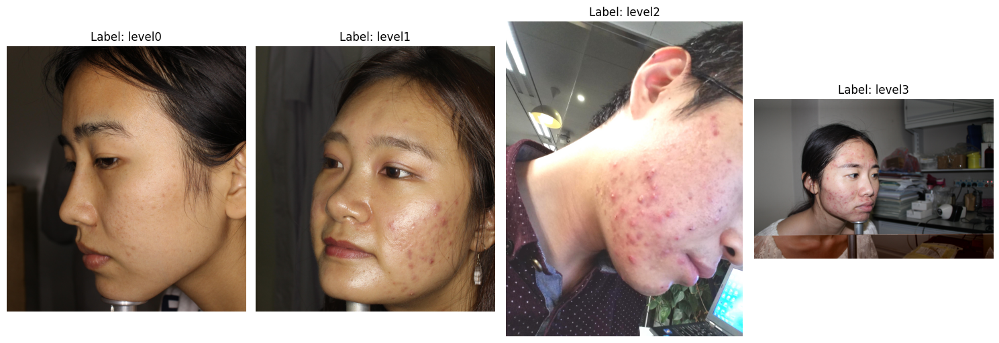

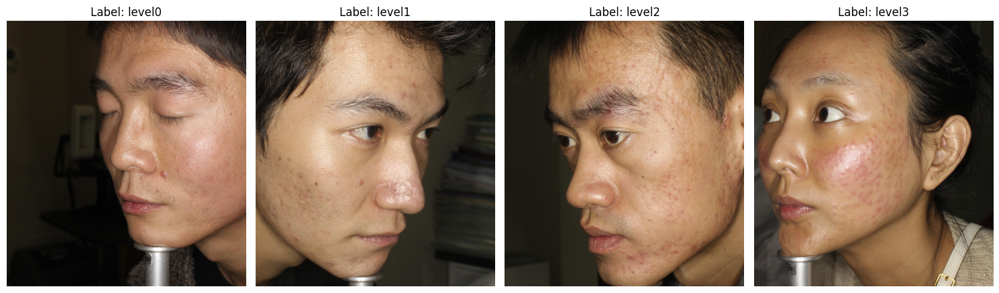

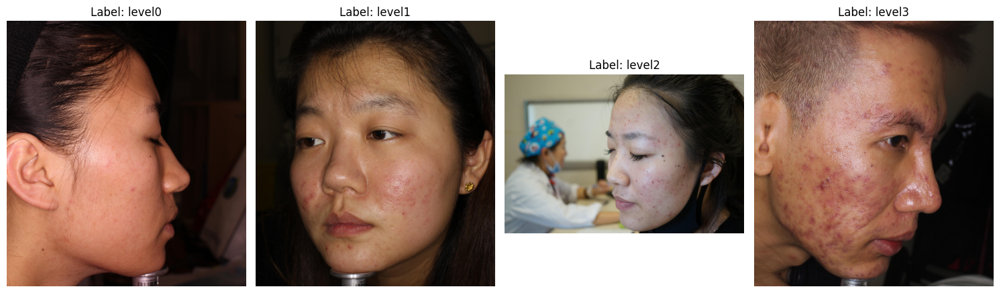

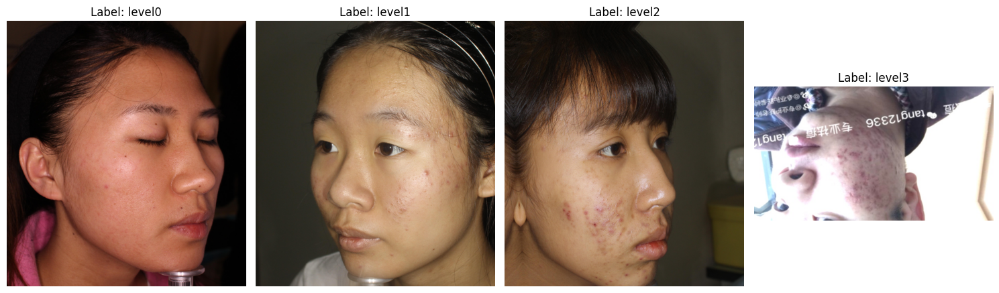

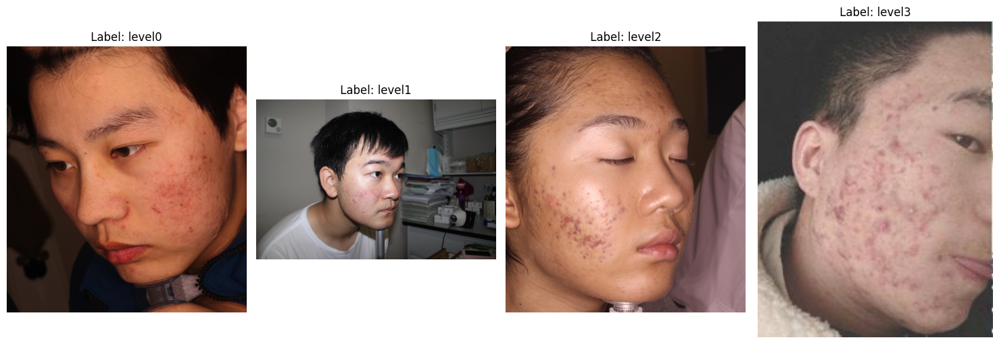

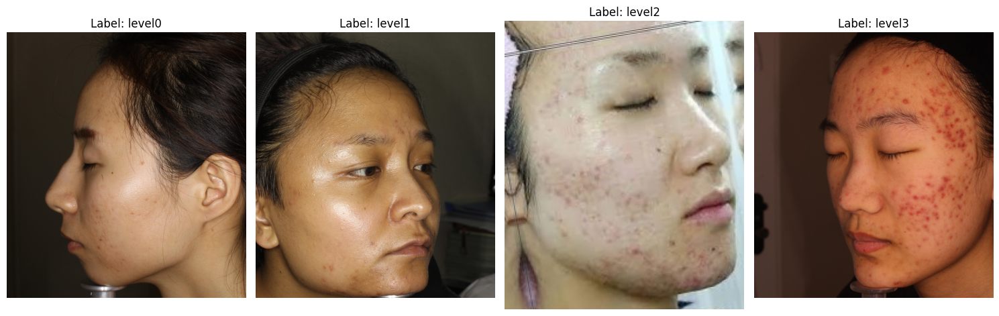

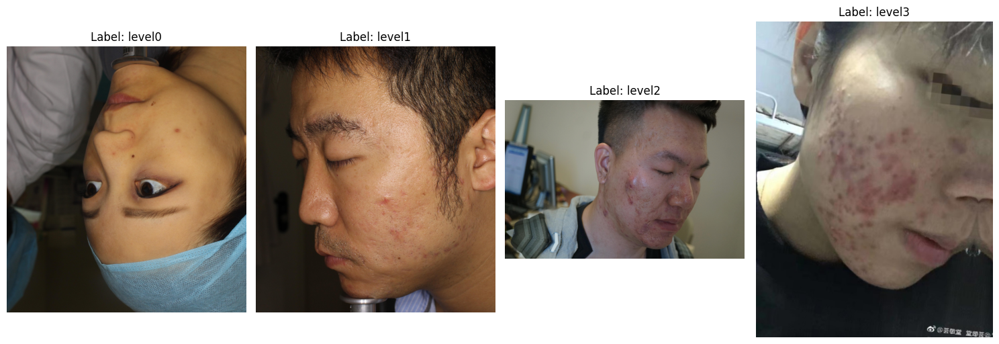

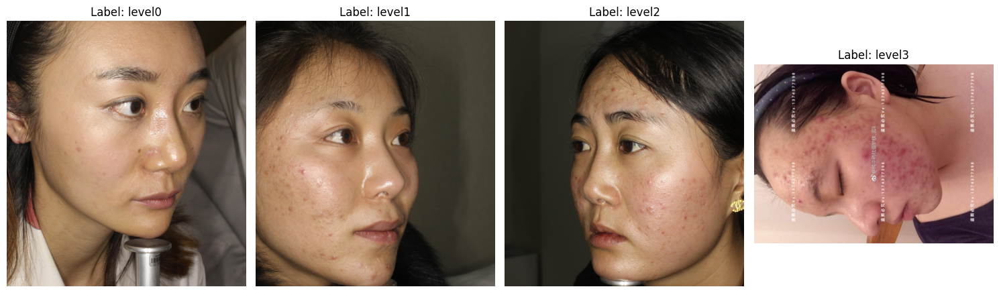

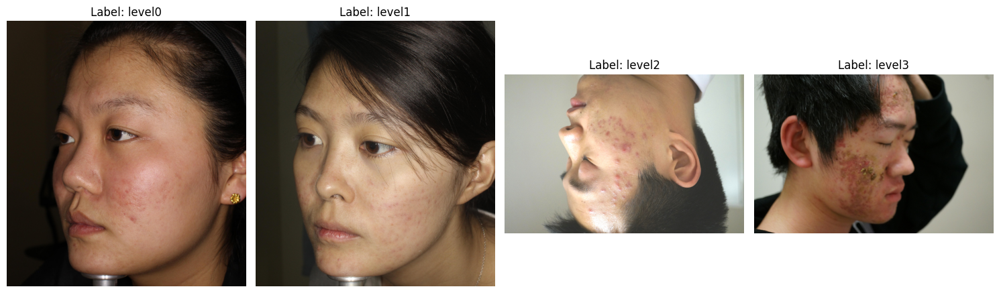

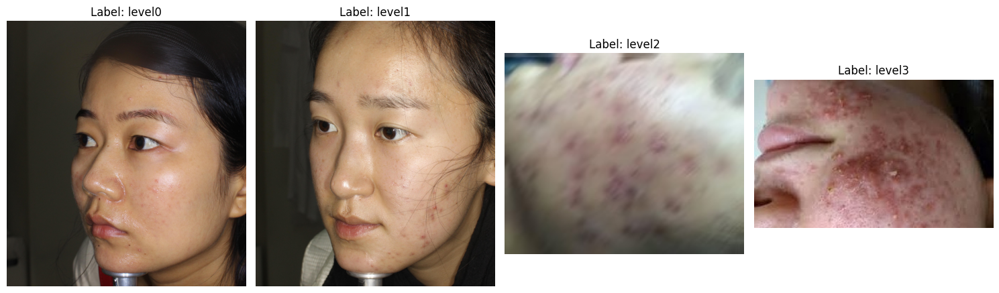

In [8]:
# Call the function with the balanced folder path
balanced_output_path = '/content/drive/MyDrive/granos_preprosesing/balanced'
for _ in range(10):
    display_random_images_by_class(balanced_output_path)

#**Image Processing**

## Functions to process the image

In [ ]:
def process_image(image_path, output_path):
    # Initialize Mediapipe to detect faces
    mp_face_detection = mp.solutions.face_detection
    mp_drawing = mp.solutions.drawing_utils

    # Rad image
    image = cv2.imread(image_path)
    original = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Detect face
    with mp_face_detection.FaceDetection(model_selection=1, min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(image)

        if results.detections:
            for detection in results.detections:
                # Get the bounding box of the face
                bboxC = detection.location_data.relative_bounding_box
                h, w, _ = image.shape
                x1, y1, x2, y2 = int(bboxC.xmin * w), int(bboxC.ymin * h), int((bboxC.xmin + bboxC.width) * w), int((bboxC.ymin + bboxC.height) * h)

                # Create a mask for the face
                mask = np.zeros((h, w), dtype=np.uint8)
                cv2.rectangle(mask, (x1, y1), (x2, y2), 255, -1)

                # Difuminite background
                blurred_image = cv2.GaussianBlur(original, (51, 51), 0)
                image_with_blurred_background = np.where(mask[:, :, None] == 255, original, blurred_image)

                # Enhance details (granularity)
                gray = cv2.cvtColor(image_with_blurred_background, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
                enhanced = cv2.equalizeHist(gray)  # Enhance contrast on the grayscale image
                final_image = cv2.cvtColor(enhanced, cv2.COLOR_GRAY2BGR)  # Convert back to BGR

                # Save the preprocessed image
                output_file = os.path.join(output_path, os.path.basename(image_path))
                cv2.imwrite(output_file, final_image)
                return output_file
        else:
            # If no face is detected, only enhance details and save
            gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
            enhanced = cv2.equalizeHist(gray)  # Enhance contrast on the grayscale image
            final_image = cv2.cvtColor(enhanced, cv2.COLOR_GRAY2BGR)  # Convert back to BGR

            # Save processed image
            output_file = os.path.join(output_path, os.path.basename(image_path))
            cv2.imwrite(output_file, final_image)
            return output_file

    return None

##procesamiento de datos de entrenamiento

In [ ]:
# Directorios
input_path = '/content/drive/MyDrive/granos_preprosesing/balanced'
output_path = '/content/drive/MyDrive/granos_preprosesing/color_processed_train'
os.makedirs(output_path, exist_ok=True)


# Process all images
for label in os.listdir(input_path):
    label_path = os.path.join(input_path, label)
    output_label_path = os.path.join(output_path, label)
    os.makedirs(output_label_path, exist_ok=True)

    for image_file in os.listdir(label_path):
        if image_file.endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(label_path, image_file)
            process_image(image_path, output_label_path)

print("Processing completed. Images have been saved on:", output_path)


KeyboardInterrupt: 

In [9]:
# Balanced path
path = '/content/drive/MyDrive/granos_preprosesing/color_processed_train'
plot_image_class_distribution(path)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/granos_preprosesing/color_processed_train'

## Visualization of processed training images

In [ ]:
# Path to the processed images folder
processed_path = '/content/drive/MyDrive/granos_preprosesing/processed_train'
for _ in range(10):
    display_random_images_by_class(processed_path)

## Pre-processing of test images

In [ ]:
# Directories
input_path = '/content/drive/MyDrive/Lambton/ai_lab/data/test'
output_path = '/content/drive/MyDrive/processed_test'
os.makedirs(output_path, exist_ok=True)


# Process all images
for label in os.listdir(input_path):
    label_path = os.path.join(input_path, label)
    output_label_path = os.path.join(output_path, label)
    os.makedirs(output_label_path, exist_ok=True)

    for image_file in os.listdir(label_path):
        if image_file.endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(label_path, image_file)
            process_image(image_path, output_label_path)

print("Procesamiento completado. Las imágenes se han guardado en:", output_path)

Procesamiento completado. Las imágenes se han guardado en: /content/drive/MyDrive//processed_test


## Visualization of processed test images

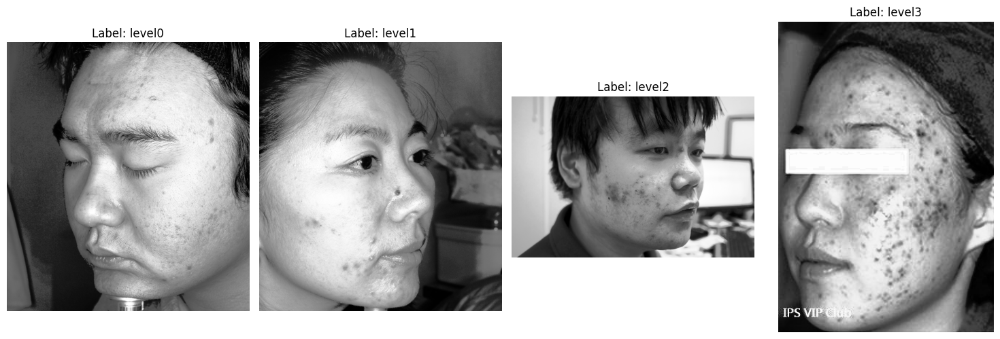

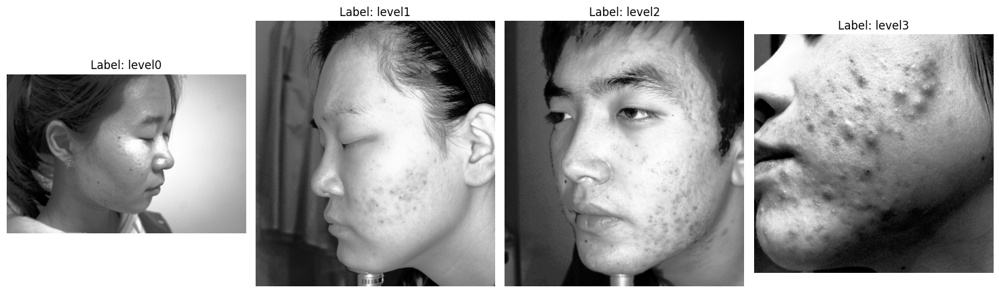

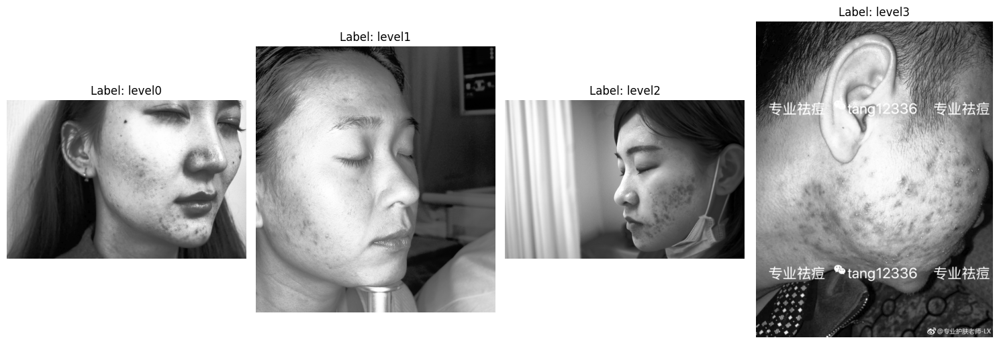

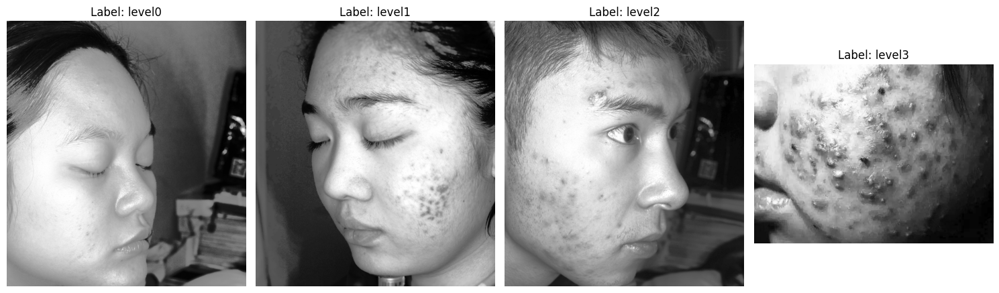

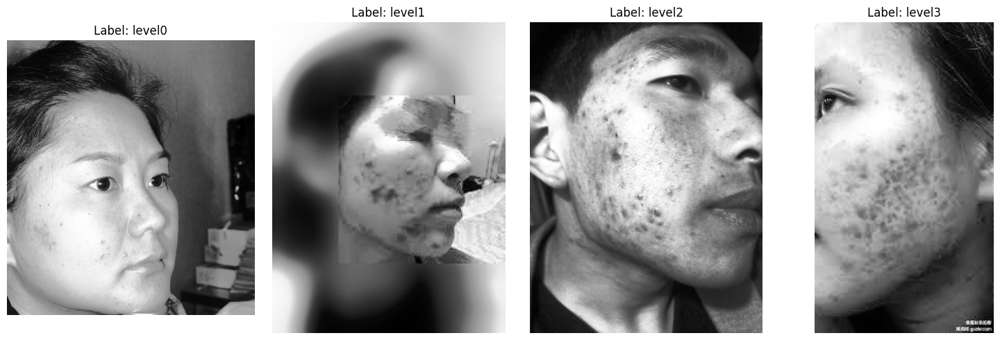

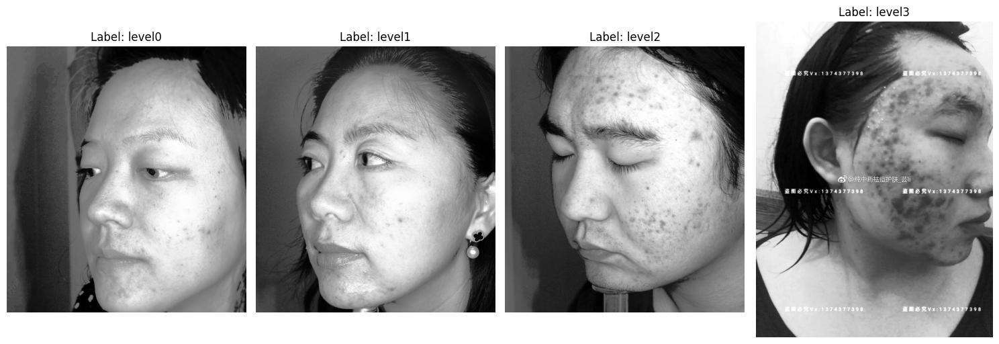

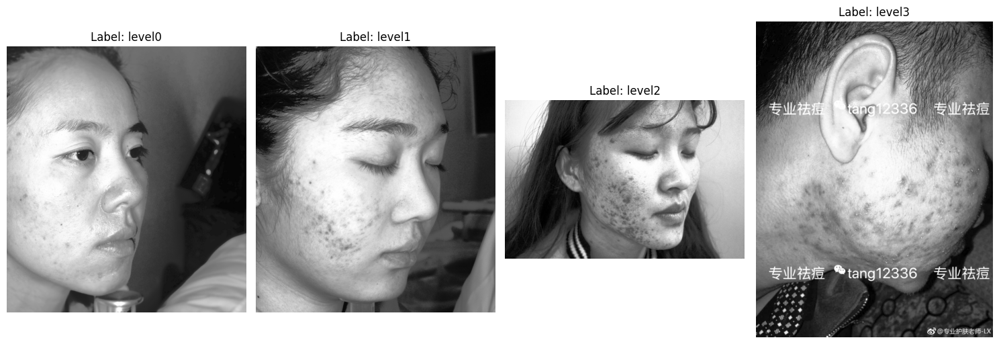

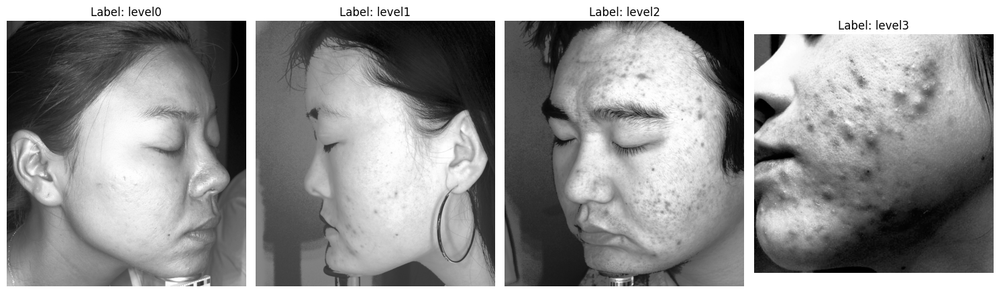

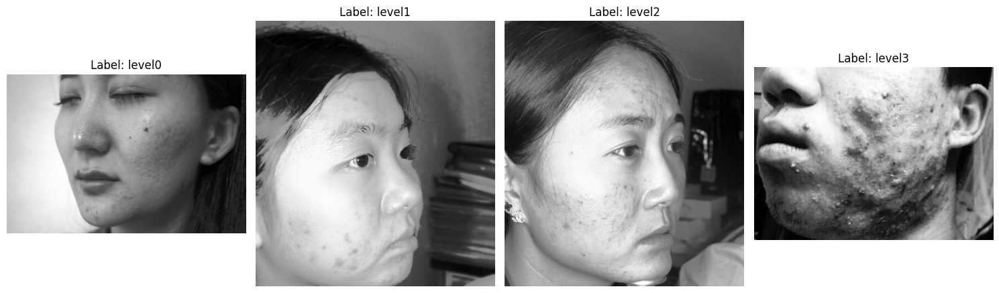

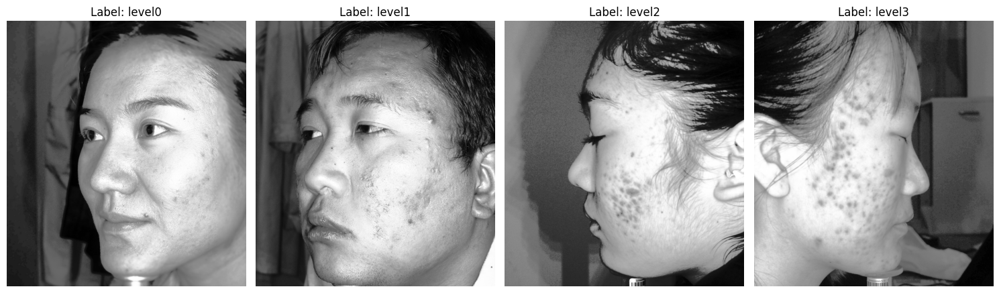

In [10]:
# Path of processed test images
processed_path = '/content/drive/MyDrive/granos_preprosesing/processed_test'
for _ in range(10):
    display_random_images_by_class(processed_path)